#### Install all dependences

In [1]:
%pip install ultralytics opencv-python-headless labelme2yolo rasterio geojson torch pytorch_lightning torchgeo pycocotools fiona requests click

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 721.0/721.0 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 41.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 801.6/801.6 kB 63.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.1/381.1 kB 47.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 63.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 61.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 733.1/733.1 kB 62.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 53.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.2/535.2 kB 54.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 61.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━

#### Import libraries

In [2]:
import os
import json
import random
import shutil
import subprocess
import glob
from pathlib import Path
from os.path import join
from google.colab import drive
import requests
import rasterio
import fiona
import geopandas as gpd
import numpy as np
import torch
import pytorch_lightning as pl
from pycocotools.coco import COCO
from shapely.geometry import shape
from sklearn.model_selection import train_test_split
from rasterio.windows import Window
from rasterio.features import geometry_mask
from osgeo import gdal
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from torchvision import models, transforms
import torchvision.transforms.functional as TF
from torch.utils.data import DataLoader, Dataset
from torchgeo.datasets import RasterDataset, stack_samples
import geojson
import ultralytics
from ultralytics import YOLO
from tqdm import tqdm
!pip install git

ERROR: Could not find a version that satisfies the requirement git (from versions: none)
ERROR: No matching distribution found for git



#### Mounts Google Drive, creates/checks EYProject directory, clones CIS4496_EY repo if absent, changes directory to CIS4496_EY

In [3]:
from google.colab import drive
import os
from pathlib import Path

def mount_google_drive():
    drive_mount_path = '/content/drive'
    try:
        if not os.path.ismount(drive_mount_path):
            drive.mount(drive_mount_path)
            print("Google Drive mounted successfully.")
        else:
            print("Google Drive is already mounted.")
    except Exception as e:
        print(f"Failed to mount Google Drive: {e}")

def clone_repository(repo_url, dest_path):
    repo_name = repo_url.split('/')[-1].replace('.git', '')
    repo_path = dest_path / repo_name
    if not repo_path.exists():
        print(f"Cloning {repo_name} into {dest_path}")
        os.system(f'git clone {repo_url} "{repo_path}"')
        print(f"{repo_name} cloned successfully.")
    else:
        print(f"{repo_name} already exists in {dest_path}.")

def setup_project():
    mount_google_drive()
    drive_root = Path('/content/drive/My Drive')
    ey_project_path = drive_root / 'EYProject'

    # Ensure EYProject directory exists
    ey_project_path.mkdir(parents=True, exist_ok=True)
    print(f"Directory setup completed at {ey_project_path}")

    # Clone CIS4496_EY repository
    clone_repository('https://github.com/ellenguyen/CIS4496_EY.git', ey_project_path)

    # Move to CIS4496_EY directory
    os.chdir(ey_project_path / 'CIS4496_EY')
    print(f"Setup completed. Current directory: {os.getcwd()}")

setup_project()


Mounted at /content/drive
Google Drive mounted successfully.
Directory setup completed at /content/drive/My Drive/EYProject
CIS4496_EY already exists in /content/drive/My Drive/EYProject.
Setup completed. Current directory: /content/drive/My Drive/EYProject/CIS4496_EY


#### Download large major datasets

In [4]:
# Function to download a file from a given URL
def download_file(url, filename):
    # Check if the file already exists
    if not os.path.exists(filename):
        print(f"Downloading {filename}...")
        response = requests.get(url)
        with open(filename, 'wb') as f:
            f.write(response.content)
    else:
        print(f"{filename} already exists. No download needed.")

# Ensure the directories exist
os.makedirs('given', exist_ok=True)
os.makedirs('generated_data', exist_ok=True)

# URLs of the files to download
files_to_download = {
    "https://challenge.ey.com/api/v1/storage/admin-files/Post_Event_San_Juan.tif": "given/Post_Event_San_Juan.tif",
    "https://challenge.ey.com/api/v1/storage/admin-files/Pre_Event_San_Juan.tif": "given/Pre_Event_San_Juan.tif",
}

# Download each file if not already downloaded
for url, filename in files_to_download.items():
    download_file(url, filename)

given/Post_Event_San_Juan.tif already exists. No download needed.
given/Pre_Event_San_Juan.tif already exists. No download needed.


#### Create Pre and Post Event Tiles from larger satellite imagery

In [5]:
def directory_is_empty_or_nonexistent(directory):
    """
    Check if a directory is empty or does not exist.
    """
    if not os.path.exists(directory):
        print(f"{directory} does not exist. Proceeding to create and upload files.")
        return True
    elif not os.listdir(directory):
        print(f"{directory} is empty. Uploading files.")
        return True
    else:
        return False

def generate_random_tiles(src_path, dst_folder, random_windows, label):
    """
    Generate tiles from a GeoTIFF image using predefined windows and label them accordingly.
    """
    print(f"Generating random tiles for {label} event...")
    with rasterio.open(src_path) as src:
        out_meta = src.meta.copy()

        for count, window in enumerate(random_windows):
            img = src.read(window=window)
            if np.any(img):
                out_meta.update({
                    "driver": "GTiff",
                    "height": window.height,
                    "width": window.width,
                    "transform": rasterio.windows.transform(window, src.transform)
                })
                # Incorporate the label into the filename
                out_path = os.path.join(dst_folder, f"{label}_random_tile_{count}.tif")
                with rasterio.open(out_path, 'w', **out_meta) as out_dst:
                    out_dst.write(img)
        print(f"Tiles generated and saved to {dst_folder} for {label} event.")

def create_random_windows(width, height, tile_width, tile_height, max_tiles):
    """
    Generate a list of random windows for tile extraction.
    """
    print("Creating random windows for tile generation...")
    random_windows = []
    for _ in range(max_tiles):
        rand_x = random.randint(0, width - tile_width)
        rand_y = random.randint(0, height - tile_height)
        window = windows.Window(rand_x, rand_y, tile_width, tile_height)
        random_windows.append(window)
    return random_windows

def main(pre_event_path, post_event_path, tile_width, tile_height, max_tiles=10):
    """
    Main function to generate random tiles from aligned pre-event and post-event images.
    """
    pre_event_dir = 'generated_data/Pre_Event_Tiles'
    post_event_dir = 'generated_data/Post_Event_Tiles'

    # Check if directories are empty or nonexistent, then proceed
    if directory_is_empty_or_nonexistent(pre_event_dir) or directory_is_empty_or_nonexistent(post_event_dir):
        os.makedirs(pre_event_dir, exist_ok=True)
        os.makedirs(post_event_dir, exist_ok=True)

        # Open one of the images to determine dimensions for window generation
        with rasterio.open(pre_event_path) as src:
            width, height = src.width, src.height

        # Generate random windows
        random_windows = create_random_windows(width, height, tile_width, tile_height, max_tiles)

        # Generate tiles for both pre and post events
        generate_random_tiles(pre_event_path, pre_event_dir, random_windows, "pre")
        generate_random_tiles(post_event_path, post_event_dir, random_windows, "post")

        print("Random tile generation completed for both pre-event and post-event images.")
    else:
        print("Both Pre_Event_Tiles and Post_Event_Tiles directories already have photos. No need to upload.")

if __name__ == "__main__":
    pre_event_path = 'given/Pre_Event_San_Juan.tif'
    post_event_path = 'given/Post_Event_San_Juan.tif'
    tile_width, tile_height = 512, 512  # Adjust as needed

    main(pre_event_path, post_event_path, tile_width, tile_height)


Both Pre_Event_Tiles and Post_Event_Tiles directories already have photos. No need to upload.


#### Convert those TIFF images above

In [6]:
def convert_tiff_to_jpeg(input_folder, output_folder):
    """
    Convert all TIFF images in the input_folder to JPEG format and save them in the output_folder,
    only if they haven't been converted already.
    """
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Keep track of conversions
    converted_count = 0
    skipped_count = 0

    # Iterate through all TIFF files in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith('.tif') or filename.endswith('.tiff'):
            # Construct the full file path for input
            input_path = os.path.join(input_folder, filename)
            # Define the output file path with a .jpg extension
            output_path = os.path.join(output_folder, os.path.splitext(filename)[0] + '.jpg')

            # Check if the JPEG version already exists
            if not os.path.exists(output_path):
                # Open the TIFF image, convert to RGB (in case it's not), and save as JPEG
                with Image.open(input_path) as img:
                    rgb_img = img.convert('RGB')
                    rgb_img.save(output_path, 'JPEG')
                print(f"Converted and saved: {output_path}")
                converted_count += 1
            else:
                print(f"Skipped (already exists): {output_path}")
                skipped_count += 1

    print(f"Conversion completed. {converted_count} images converted. {skipped_count} images skipped.")
    print(f"JPEG images are saved in {output_folder}.")

# Adjust to your actual input and output folder paths
input_folder_pre = 'generated_data/Pre_Event_Tiles'
output_folder_pre = 'generated_data/Pre_Event_Tiles_JPEG'
convert_tiff_to_jpeg(input_folder_pre, output_folder_pre)

input_folder_post = 'generated_data/Post_Event_Tiles'
output_folder_post = 'generated_data/Post_Event_Tiles_JPEG'
convert_tiff_to_jpeg(input_folder_post, output_folder_post)


Skipped (already exists): generated_data/Pre_Event_Tiles_JPEG/pre_random_tile_4.jpg
Skipped (already exists): generated_data/Pre_Event_Tiles_JPEG/pre_random_tile_5.jpg
Skipped (already exists): generated_data/Pre_Event_Tiles_JPEG/pre_random_tile_6.jpg
Skipped (already exists): generated_data/Pre_Event_Tiles_JPEG/pre_random_tile_7.jpg
Skipped (already exists): generated_data/Pre_Event_Tiles_JPEG/pre_random_tile_8.jpg
Skipped (already exists): generated_data/Pre_Event_Tiles_JPEG/pre_random_tile_9.jpg
Skipped (already exists): generated_data/Pre_Event_Tiles_JPEG/pre_random_tile_0.jpg
Skipped (already exists): generated_data/Pre_Event_Tiles_JPEG/pre_random_tile_1.jpg
Skipped (already exists): generated_data/Pre_Event_Tiles_JPEG/pre_random_tile_2.jpg
Skipped (already exists): generated_data/Pre_Event_Tiles_JPEG/pre_random_tile_3.jpg
Conversion completed. 0 images converted. 10 images skipped.
JPEG images are saved in generated_data/Pre_Event_Tiles_JPEG.
Skipped (already exists): generated_d

#### I noticed the images were not square. Crop them into the largest square possible

In [7]:
def crop_tiles_to_square(src_folder, dst_folder):
    """
    Crop all TIFF tiles in the source folder to square dimensions, maximizing the size of the image,
    and save them to the destination folder if they haven't been cropped already.
    """
    os.makedirs(dst_folder, exist_ok=True)  # Create destination folder if it doesn't exist

    cropped_count = 0
    skipped_count = 0

    for tile_filename in os.listdir(src_folder):
        if tile_filename.endswith('.tif') or tile_filename.endswith('.tiff'):
            src_path = os.path.join(src_folder, tile_filename)
            dst_path = os.path.join(dst_folder, tile_filename)

            # Check if the tile has already been cropped and saved
            if not os.path.exists(dst_path):
                with rasterio.open(src_path) as src:
                    # Determine the minimum dimension to make the image square
                    min_dim = min(src.width, src.height)
                    # Calculate offsets for centering the crop
                    off_x = (src.width - min_dim) // 2
                    off_y = (src.height - min_dim) // 2

                    # Define the window to crop the square area
                    window = Window(off_x, off_y, min_dim, min_dim)
                    window_transform = src.window_transform(window)

                    # Read the data from the window
                    data = src.read(window=window)

                    # Update metadata for the output image
                    out_meta = src.meta.copy()
                    out_meta.update({
                        "driver": "GTiff",
                        "height": min_dim,
                        "width": min_dim,
                        "transform": window_transform
                    })

                    # Write the cropped square image
                    with rasterio.open(dst_path, 'w', **out_meta) as dst:
                        dst.write(data)

                print(f"Cropped and saved: {dst_path}")
                cropped_count += 1
            else:
                print(f"Skipped (already exists): {dst_path}")
                skipped_count += 1

    print(f"All tiles processed. {cropped_count} images cropped. {skipped_count} images skipped.")
    print("Cropped tiles are saved to the destination folder.")

# Example usage
src_folder = 'generated_data/Pre_Event_Tiles'  # Adjust to your actual source directory of tiles
dst_folder = 'generated_data/Pre_Event_Tiles_Square'  # Desired destination directory for square tiles
crop_tiles_to_square(src_folder, dst_folder)

# Repeat for post-event tiles if necessary
src_folder_post = 'generated_data/Post_Event_Tiles'  # Adjust to your actual source directory of tiles
dst_folder_post = 'generated_data/Post_Event_Tiles_Square'  # Desired destination directory for square tiles
crop_tiles_to_square(src_folder_post, dst_folder_post)


Skipped (already exists): generated_data/Pre_Event_Tiles_Square/pre_random_tile_4.tif
Skipped (already exists): generated_data/Pre_Event_Tiles_Square/pre_random_tile_5.tif
Skipped (already exists): generated_data/Pre_Event_Tiles_Square/pre_random_tile_6.tif
Skipped (already exists): generated_data/Pre_Event_Tiles_Square/pre_random_tile_7.tif
Skipped (already exists): generated_data/Pre_Event_Tiles_Square/pre_random_tile_8.tif
Skipped (already exists): generated_data/Pre_Event_Tiles_Square/pre_random_tile_9.tif
Skipped (already exists): generated_data/Pre_Event_Tiles_Square/pre_random_tile_0.tif
Skipped (already exists): generated_data/Pre_Event_Tiles_Square/pre_random_tile_1.tif
Skipped (already exists): generated_data/Pre_Event_Tiles_Square/pre_random_tile_2.tif
Skipped (already exists): generated_data/Pre_Event_Tiles_Square/pre_random_tile_3.tif
All tiles processed. 0 images cropped. 10 images skipped.
Cropped tiles are saved to the destination folder.
Skipped (already exists): gener

#### Import Rio De Jeniero Dataset with Polygons in YOLO format

#### Instructions for Manual Download and Setup
1. Visit the shareable link: [External Rio De Janeiro Dataset](https://drive.google.com/drive/folders/1w8rY4OGiB8aJ921MpSvDbiclAVWOqbTR?usp=sharing).
2. Download the entire `dataset` directory.
3. Place it in your Google Drive under `/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/`.

> It took me a while to get it in YOLO format. I had to go through a bunch of tests and created [many other formats along the way](https://drive.google.com/drive/folders/1GoOg6lXnZKLkdUBzkEeXa4DhqUVbEqw6?usp=sharing). These may be needed by other ML models.


#### Expected YOLO Dataset Hierarchy
Ensure your dataset follows this hierarchy for proper organization and access:

- `dataset`
  - `dataset.yaml`
  - `images`
    - `train`
    - `val`
  - `labels`
    - `train`
    - `val`

This structure should reflect in your local or Google Drive directory as specified in the setup. Ensure the names and counts of training and validation images and labels match to avoid issues during training or validation phases.


In [8]:
import os

def count_files(directory):
    """Count number of files in a directory."""
    return len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])

def print_snapshot(directory, num_files=5):
    """Print a snapshot of a few files from the directory."""
    files = os.listdir(directory)[:num_files]
    print(f"Snapshot of files in {directory}:")
    for file in files:
        print(file)
    print("\n")

# Directory setup
dataset_dir = "/content/drive/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/dataset"
train_images_dir = os.path.join(dataset_dir, "images", "train")
val_images_dir = os.path.join(dataset_dir, "images", "val")
train_labels_dir = os.path.join(dataset_dir, "labels", "train")
val_labels_dir = os.path.join(dataset_dir, "labels", "val")

# Count files
train_images_count = count_files(train_images_dir)
val_images_count = count_files(val_images_dir)
train_labels_count = count_files(train_labels_dir)
val_labels_count = count_files(val_labels_dir)

# Print counts
print(f"Training images: {train_images_count}")
print(f"Validation images: {val_images_count}")
print(f"Training labels: {train_labels_count}")
print(f"Validation labels: {val_labels_count}")

# Verify matching counts
if train_images_count == train_labels_count and val_images_count == val_labels_count:
    print("\n Counts match! Dataset is properly organized. \n")
else:
    print("Counts do not match. Please check the dataset organization.")

# Print a snapshot of files in directories
print_snapshot(train_images_dir)
print_snapshot(val_images_dir)
print_snapshot(train_labels_dir)
print_snapshot(val_labels_dir)


Training images: 5552
Validation images: 1388
Training labels: 5552
Validation labels: 1388

 Counts match! Dataset is properly organized. 

Snapshot of files in /content/drive/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/dataset/images/train:
img155.jpg
img5908.jpg
img2406.jpg
img1578.jpg
img491.jpg


Snapshot of files in /content/drive/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/dataset/images/val:
img5184.jpg
img6367.jpg
img1484.jpg
img6138.jpg
img4133.jpg


Snapshot of files in /content/drive/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/dataset/labels/train:
img5791.txt
img3627.txt
img1587.txt
img4944.txt
img6554.txt


Snapshot of files in /content/drive/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/dataset/labels/val:
img874.txt
img2291.txt
img3030.txt
img4534.txt
img2524.txt




#### High-Level Overview
#####  This script visualizes the polygons specified in annotation files onto the corresponding images from the training dataset. It focuses on the first 10 non-empty annotation files, converting the normalized coordinates back to pixel coordinates for visualization.


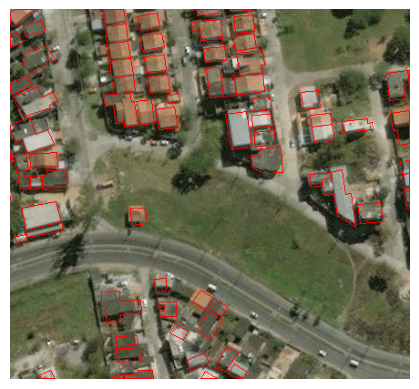

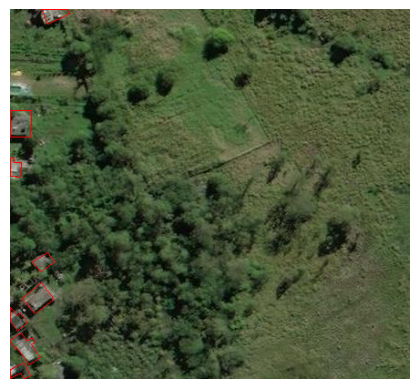

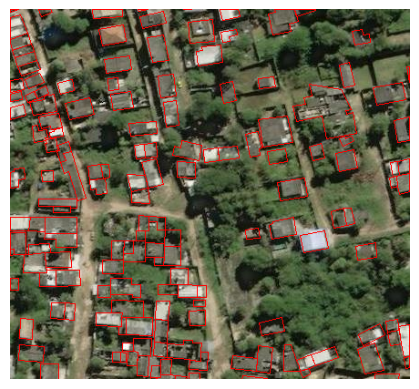

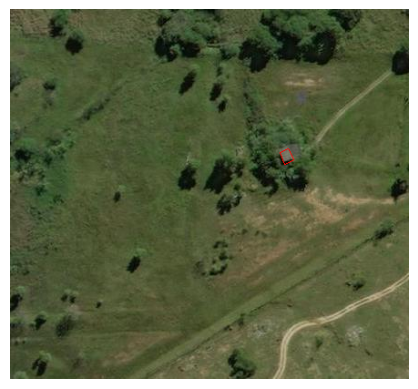

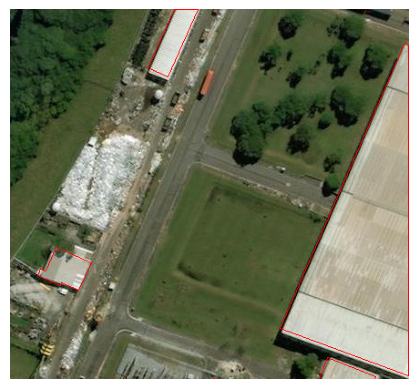

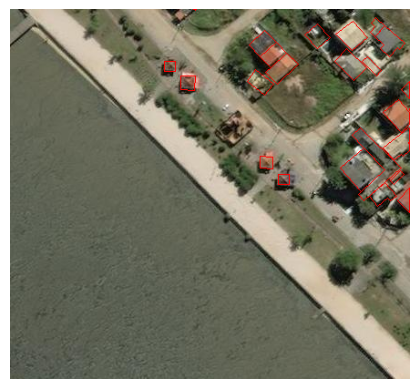

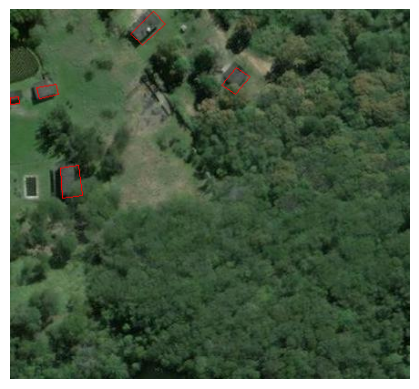

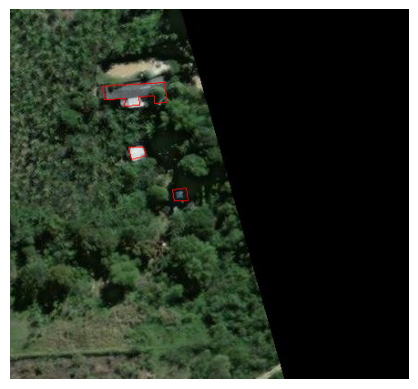

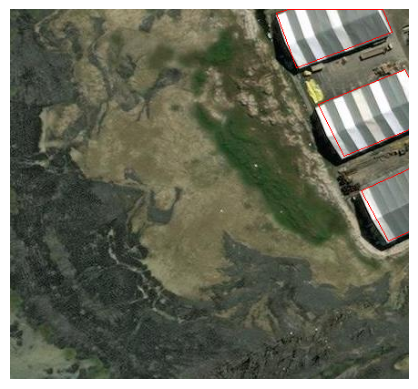

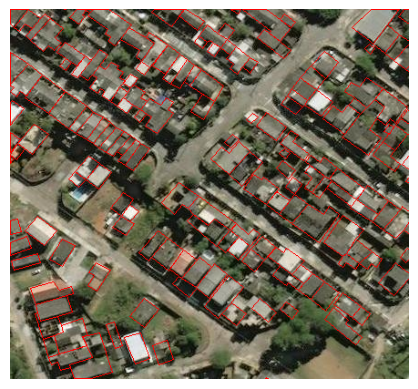

In [9]:
import os
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def visualize_annotation(image_path, annotation_path, img_width, img_height):
    """Visualizes annotations on a given image by drawing polygons."""
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)
    with open(annotation_path, 'r') as file:
        for line in file:
            _, *coords = line.strip().split()
            coords = [float(c) for c in coords]
            # Convert normalized coordinates back to pixel coordinates and draw polygons
            pixel_coords = [(coords[i] * img_width, coords[i+1] * img_height) for i in range(0, len(coords), 2)]
            draw.polygon(pixel_coords, outline='red')
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Corrected directory paths for training images and annotations
images_dir = "/content/drive/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/dataset/images/train/"
annotations_dir = "/content/drive/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/dataset/labels/train/"
# Assume fixed image dimensions for demonstration
img_width, img_height = 438, 406

# Select the first 10 non-empty annotation files from the training dataset
non_empty_annotation_files = [f for f in os.listdir(annotations_dir) if f.endswith('.txt') and os.path.getsize(os.path.join(annotations_dir, f)) > 0][:10]

for annotation_file in non_empty_annotation_files:
    image_file = annotation_file.replace('.txt', '.jpg')
    visualize_annotation(os.path.join(images_dir, image_file), os.path.join(annotations_dir, annotation_file), img_width, img_height)


In [14]:
# First, ensure that you have installed the Ultralytics YOLO package and other necessary libraries.
# Since YOLOv8 isn't officially released by Ultralytics as of my last update, the following code is a projection
# and should be adapted according to the official release and documentation.

from ultralytics import YOLO

# Path to your dataset's YAML file. Update it according to your actual file's location.
# This file should be in your dataset folder inside the EYProject/CIS4496_EY directory
dataset_yaml_path = "/content/drive/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/dataset/dataset.yaml"

# Load a pretrained model. If YOLOv8n.pt is not available, adapt this line according to the available pretrained models.
model = YOLO("yolov8n.pt")  # Assuming yolov8n.pt is a path to a pretrained model suitable for your task.

# Train the model using your dataset
# Make sure that `data` points to your dataset.yaml file.
# You might need to adjust `epochs` and other training parameters based on your requirements.
model.train(data=dataset_yaml_path, epochs=3)

# Evaluate model performance on the validation set. This requires your dataset.yaml to properly define the validation dataset.
metrics = model.val()

# Optionally, you can predict on an image or export the model to a different format.
# results = model("path_to_an_image.jpg")
# path = model.export(format="onnx")  # Export the model to ONNX format (if needed)


Ultralytics YOLOv8.1.26 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/dataset/dataset.yaml, epochs=3, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, sav

train: Scanning /content/drive/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/dataset/labels/train.cache... 5552 images, 2128 backgrounds, 0 corrupt: 100%|██████████| 5552/5552 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/dataset/labels/val... 1388 images, 502 backgrounds, 0 corrupt: 100%|██████████| 1388/1388 [01:51<00:00, 12.50it/s] 


val: New cache created: /content/drive/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/dataset/labels/val.cache
Plotting labels to runs/detect/train5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train5
Starting training for 3 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/3      7.08G      2.399      1.794      1.455        679        640: 100%|██████████| 347/347 [03:29<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:18<00:00,  2.41it/s]


                   all       1388      49506      0.457      0.401      0.329      0.115

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/3       9.7G      2.306      1.481      1.405        775        640: 100%|██████████| 347/347 [03:18<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:18<00:00,  2.42it/s]


                   all       1388      49506      0.486       0.45      0.406      0.144

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/3      6.68G      2.266      1.436      1.386        800        640: 100%|██████████| 347/347 [03:20<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:16<00:00,  2.64it/s]


                   all       1388      49506      0.573      0.477      0.466      0.172

3 epochs completed in 0.185 hours.
Optimizer stripped from runs/detect/train5/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train5/weights/best.pt, 6.2MB

Validating runs/detect/train5/weights/best.pt...
Ultralytics YOLOv8.1.26 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:34<00:00,  1.26it/s]


                   all       1388      49506      0.573      0.477      0.466      0.172
Speed: 0.2ms preprocess, 1.9ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/train5
Ultralytics YOLOv8.1.26 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/EYProject/CIS4496_EY/given/Rio_Data/dataset/labels/val.cache... 1388 images, 502 backgrounds, 0 corrupt: 100%|██████████| 1388/1388 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 87/87 [00:48<00:00,  1.78it/s]


                   all       1388      49506      0.572      0.479      0.466      0.173
Speed: 0.2ms preprocess, 3.6ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/train52


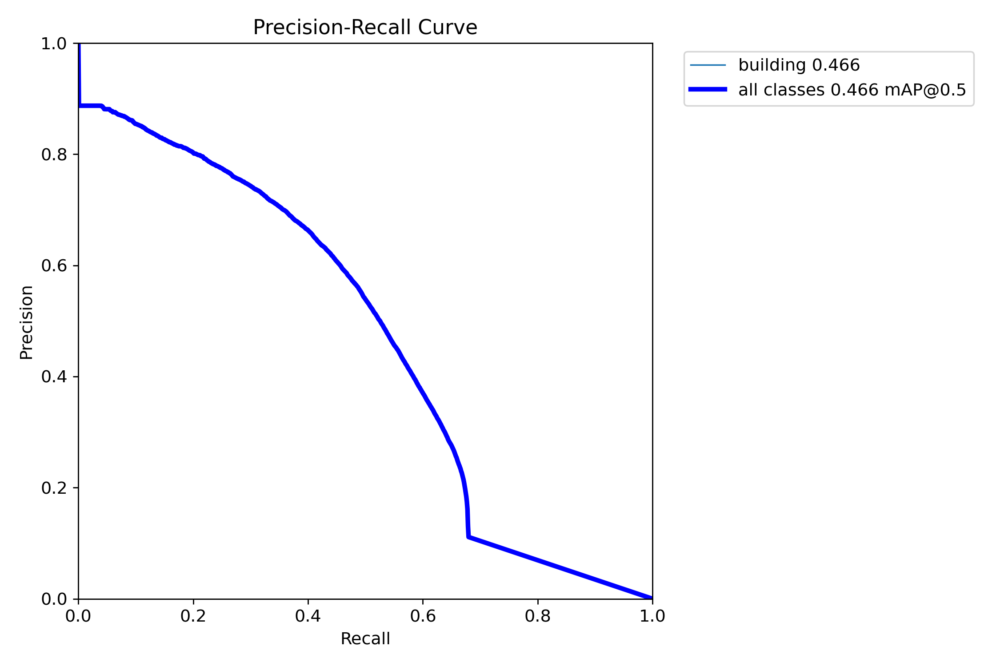

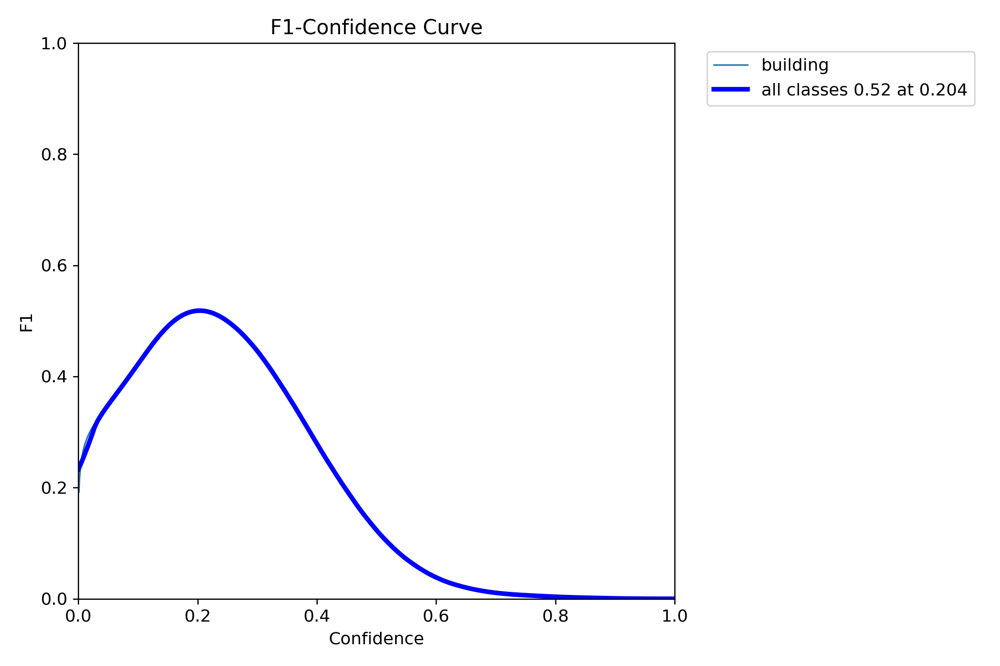

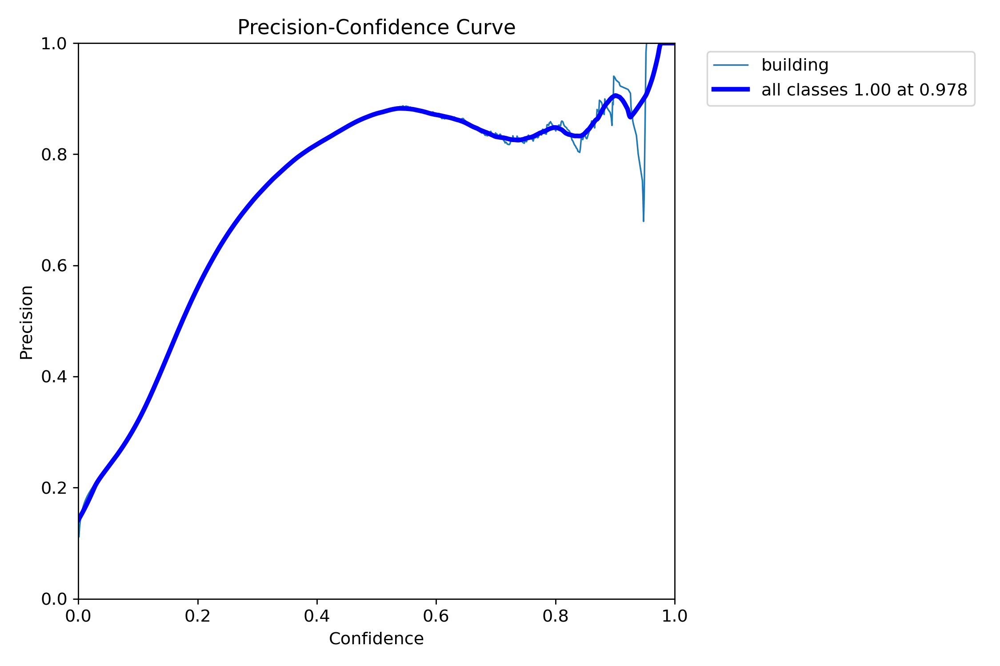

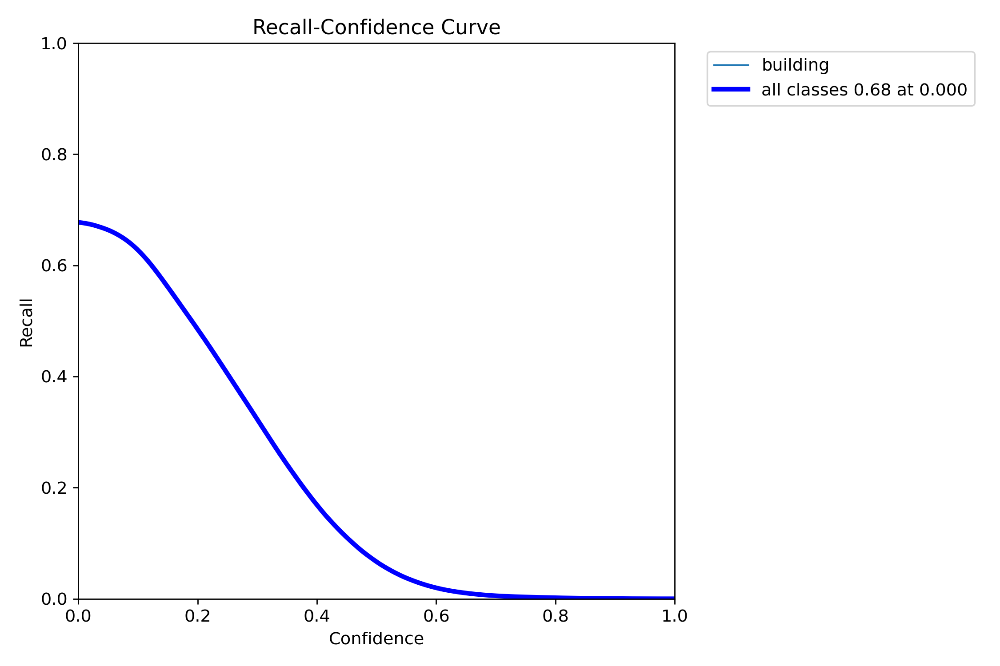

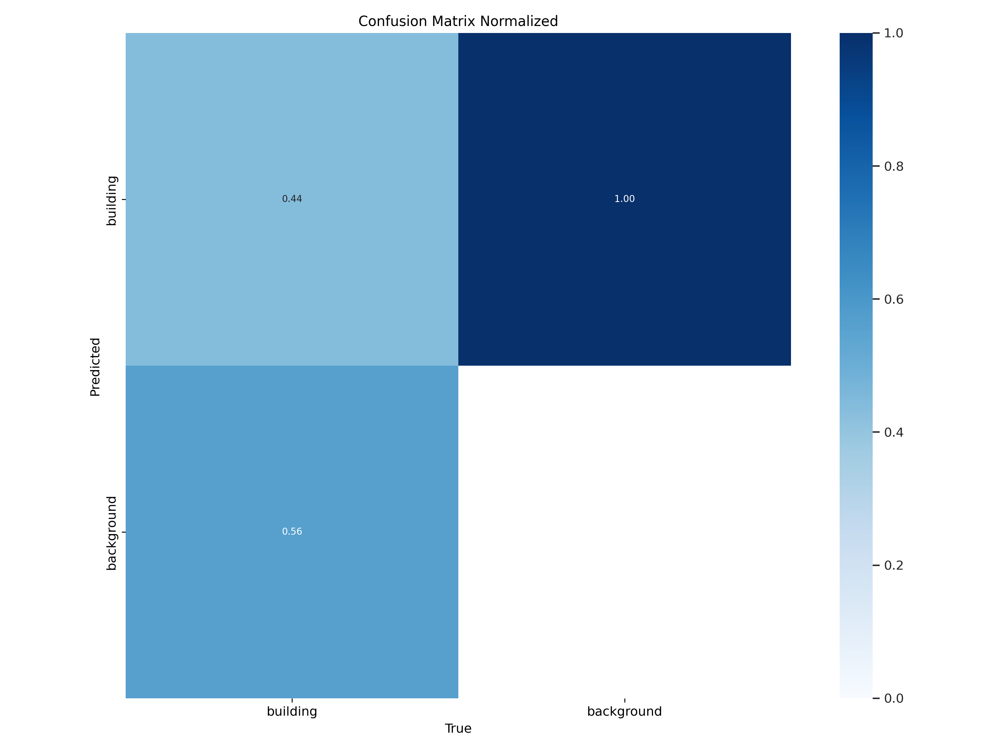

...

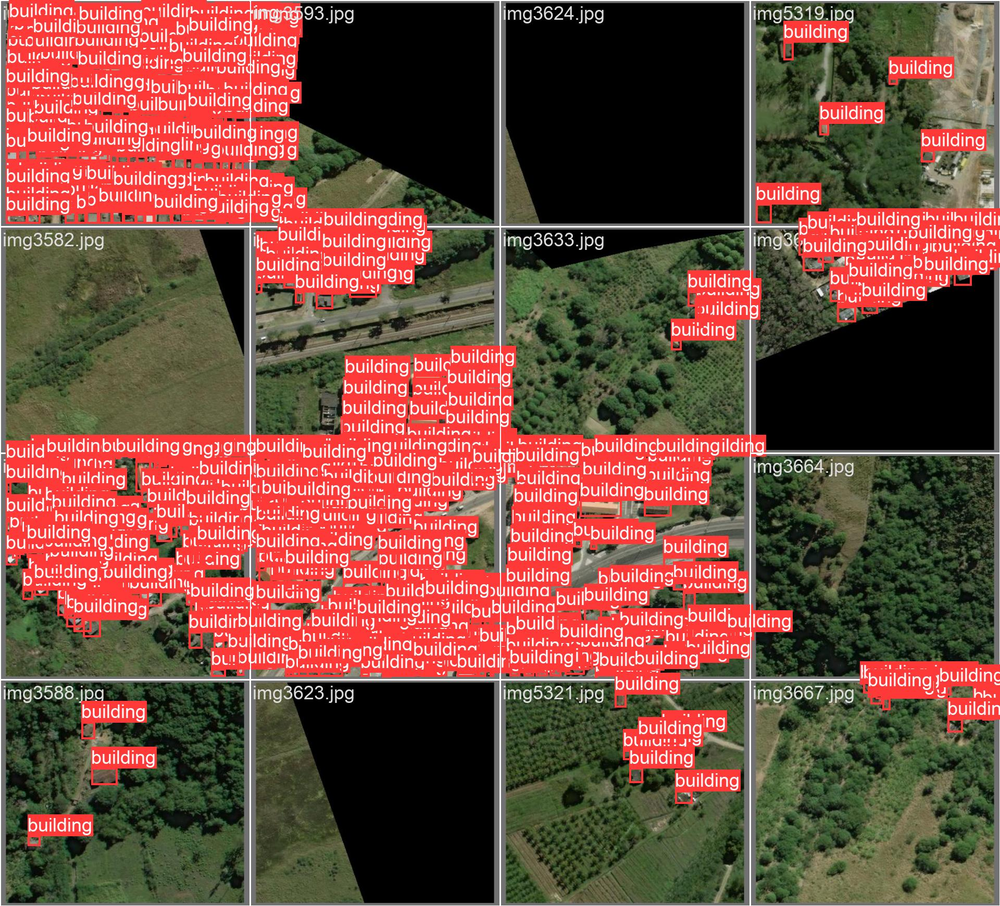

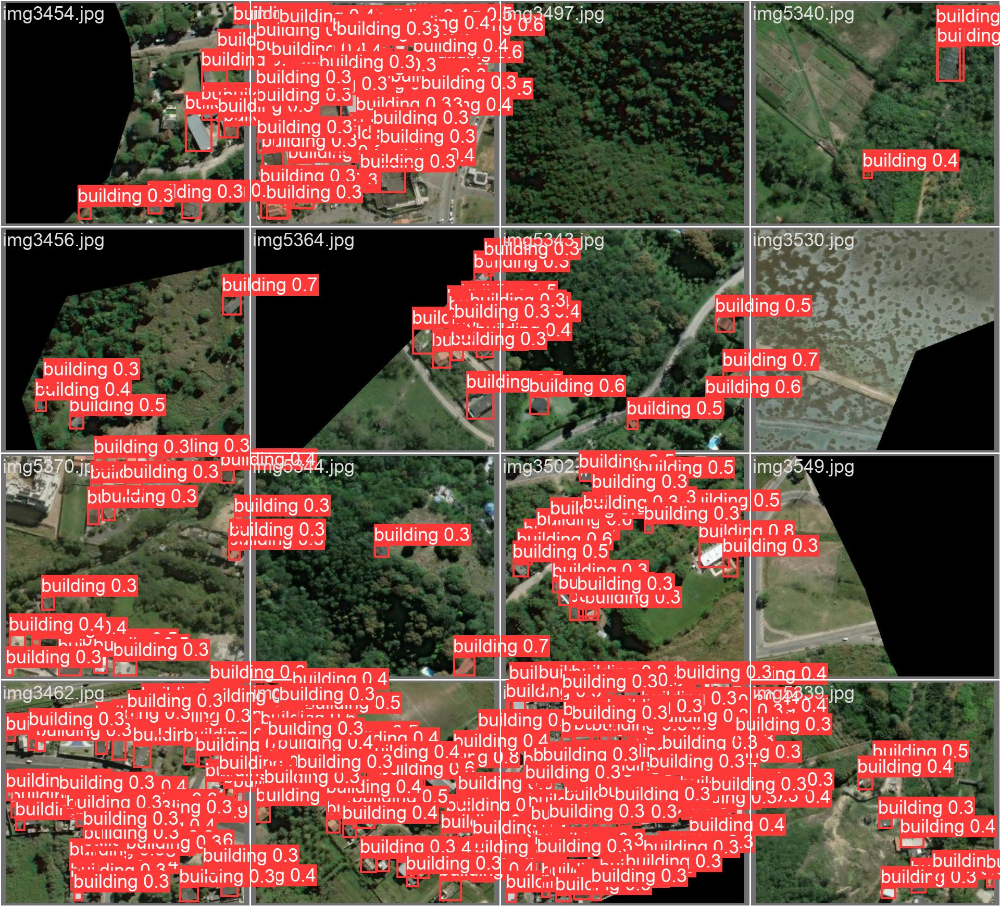

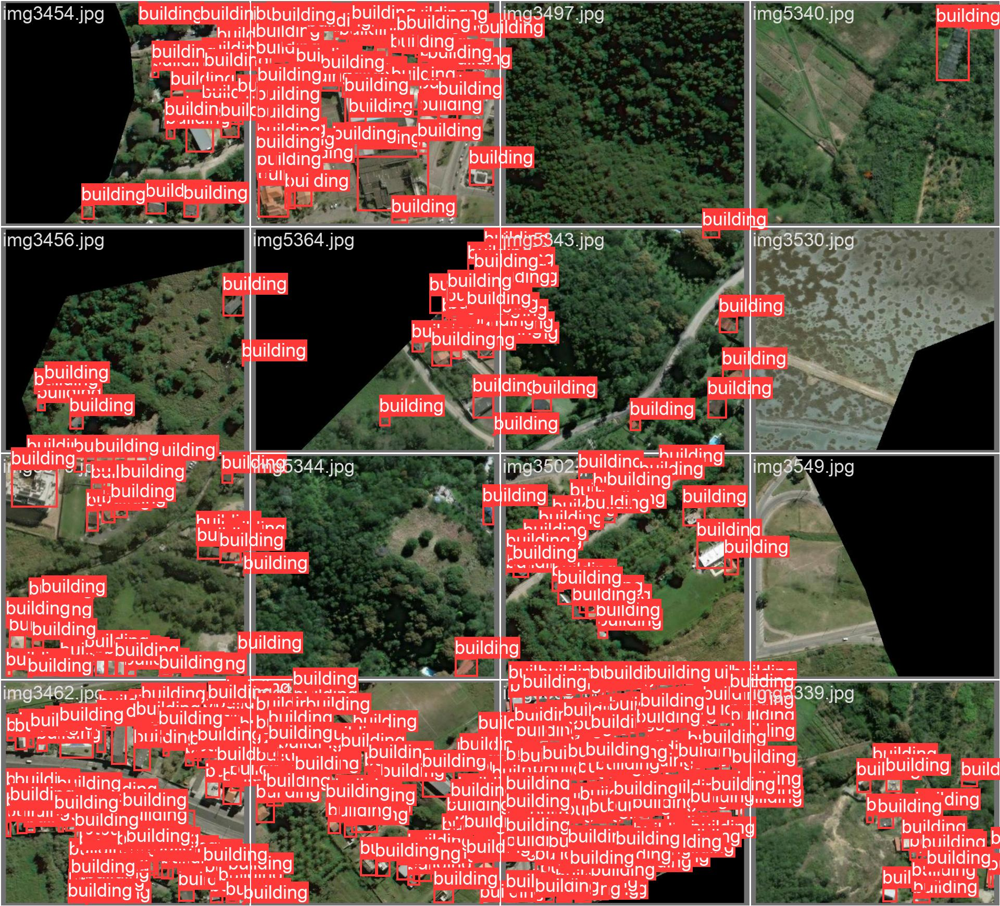

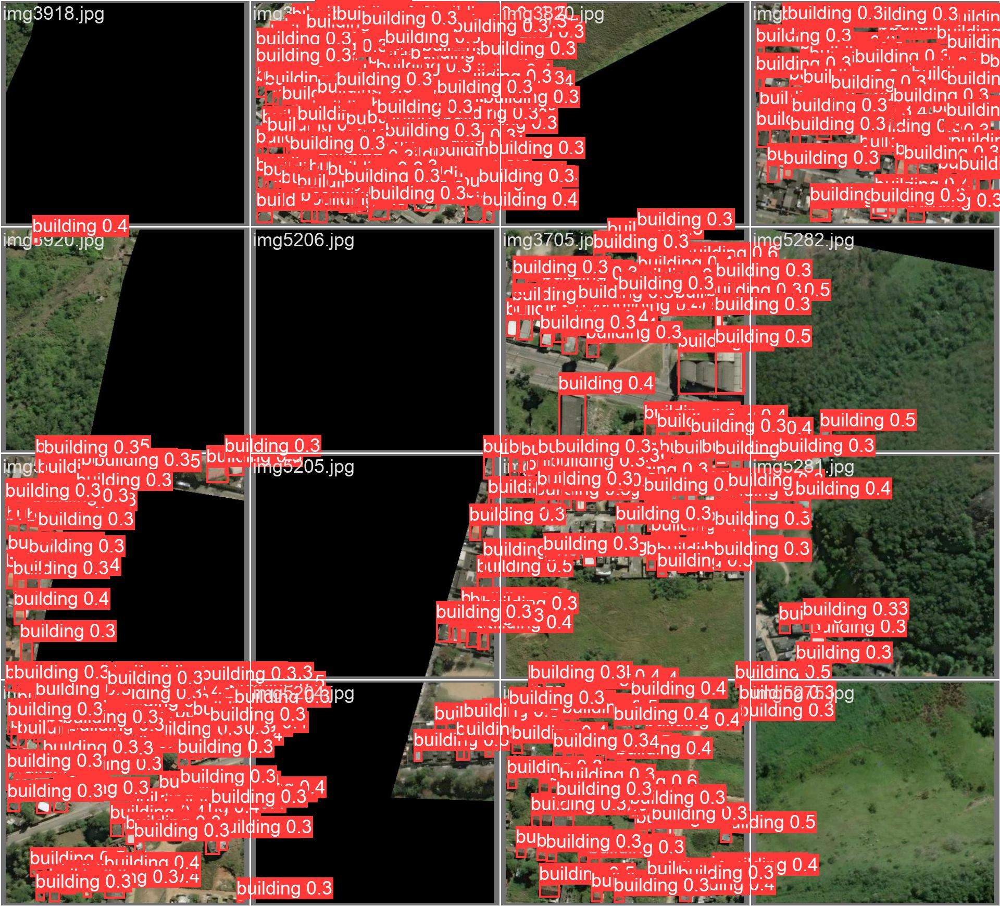

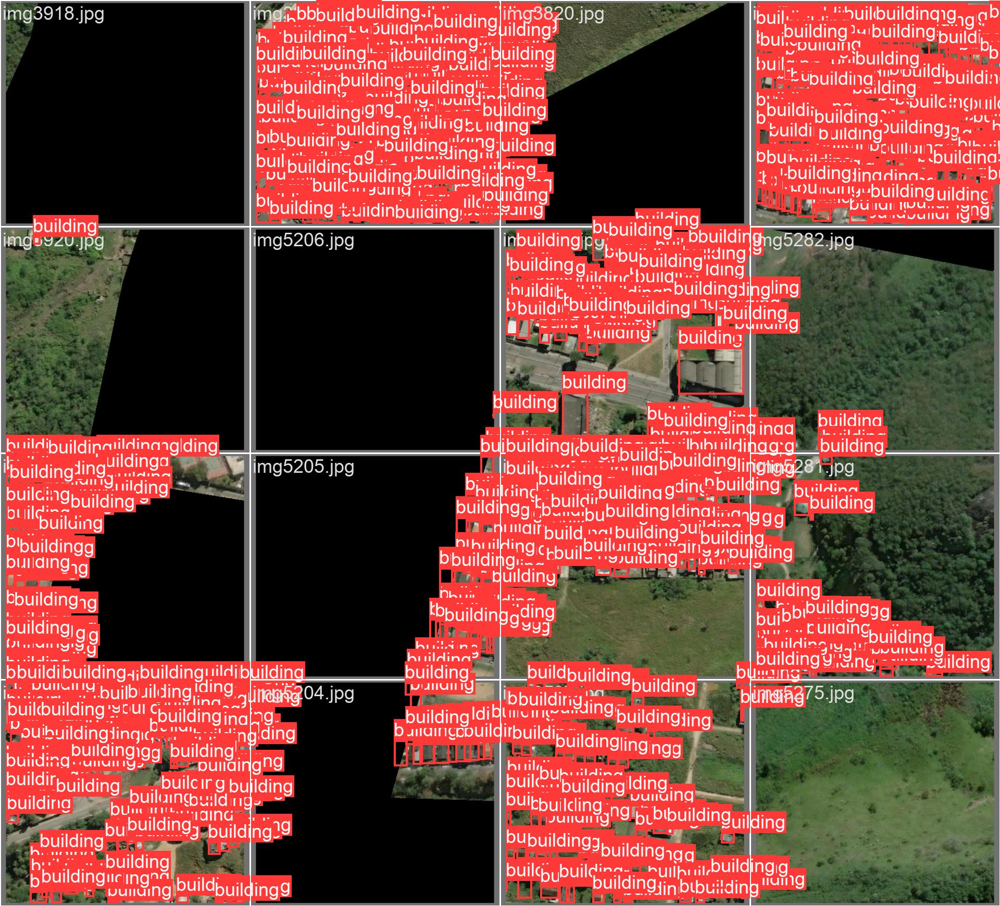

In [49]:
from ultralytics import YOLO
import os
from IPython.display import Image, display
import glob

# Path to the directory where your YOLO model's best weights are saved
model_weights_path = "/content/drive/MyDrive/EYProject/CIS4496_EY/runs/detect/train5/weights/best.pt"

# Load the trained model
model = YOLO(model_weights_path)

# Directory where the images are located
image_dir = "/content/drive/MyDrive/EYProject/CIS4496_EY/runs/detect/train5"

# Gather all image file paths png
image_paths = glob.glob(os.path.join(image_dir, '*.png'))  # Adjust pattern as needed

# Display images
for image_path in image_paths:
    display(Image(filename=image_path))

# Gather all image file paths png
image_paths = glob.glob(os.path.join(image_dir, '*.jpg'))  # Adjust pattern as needed

# Display images
for image_path in image_paths:
    display(Image(filename=image_path))




The next steps:

- Predict on specific images, ensuring show.label is set to False for clearer visualization of results.

- Predict on our dataset! However, when passing an image to model(), extracting the boxes has been challenging.

- Hopefully, we can also train this to detect polygons (perhaps segmentation?).

- Given that our satellite imagery is of higher quality, I remain optimistic.